In [56]:
import pandas as pd
import itertools
import string
import numpy as np
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
pd.set_option('display.max_rows',20)


In [57]:
df=pd.read_csv('drugsComTrain_raw.tsv',sep='\t')
df

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil""",9.0,"May 20, 2012",27
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective.""",8.0,"April 27, 2010",192
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.""",5.0,"December 14, 2009",17
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch""",8.0,"November 3, 2015",10
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I spent on oxycontin.""",9.0,"November 27, 2016",37
...,...,...,...,...,...,...,...
161292,191035,Campral,Alcohol Dependence,"""I wrote my first report in Mid-October of 2014. I have not had any alcohol at all since that post, have reduced my dosage to 1 pill first thing in the morning. I am a very social person, and entertained a great deal. I was very very worried that I would relapse if faced with the availability of alcohol. I have sailed through all my seasonal parties, early spring get togethers and weekly &quot;wings and beer&quot; with friends with not one slip. My husband and daughter are huge supporters. As I write this, I have various wines and liquors in my cabinet - serve to guests - and have no interest at all in consuming booze in any form. Again, I state that Campral saved my life.""",10.0,"May 31, 2015",125
161293,127085,Metoclopramide,Nausea/Vomiting,"""I was given this in IV before su

In [58]:
pd.set_option('display.max_rows', None)
df.condition.value_counts()


condition
Birth Control                                                          28788
Depression                                                              9069
Pain                                                                    6145
Anxiety                                                                 5904
Acne                                                                    5588
Bipolar Disorde                                                         4224
Insomnia                                                                3673
Weight Loss                                                             3609
Obesity                                                                 3568
ADHD                                                                    3383
Diabetes, Type 2                                                        2554
Emergency Contraception                                                 2463
High Blood Pressure                                               

In [59]:
df_train =df[(df['condition']=='Birth Control') | (df['condition']=='Depression') |(df['condition']=='Migrane')|(df['condition']=='Pain')|(df['condition']=='Abnormal Uterine Bleeding')
             |(df['condition']=='Vaginal Yeast Infection')|(df['condition']=='High Blood Pressure')|(df['condition']=='Diabetes, Type 2')|(df['condition']=='Insomnia')|(df['condition']=='Acne')
             |(df['condition']=='Constipation')|(df['condition']=='Chronic Pain')]

In [60]:
df.shape

(161297, 7)

In [61]:
df_train.shape


(65558, 7)

In [62]:

X = df_train.drop(['Unnamed: 0','drugName','rating','date','usefulCount'],axis=1)


EDA

In [63]:
X.condition.value_counts()

condition
Birth Control                28788
Depression                    9069
Pain                          6145
Acne                          5588
Insomnia                      3673
Diabetes, Type 2              2554
High Blood Pressure           2321
Vaginal Yeast Infection       2274
Abnormal Uterine Bleeding     2096
Constipation                  1595
Chronic Pain                  1455
Name: count, dtype: int64

In [64]:
#SEGREGATING FOR ANALYZING INDIVIDUAL CONDITION
X_birth=X[(X['condition']=='Birth Control')]
X_dep  =X[(X['condition']=='Depression')]
X_pa   =X[(X['condition']=='Pain')]
X_Ac   =X[(X['condition']=='Acne')]
X_Ins  =X[(X['condition']=='Insomnia')]
X_Dia  =X[(X['condition']=='Diabetes, Type 2')]
X_Hibp =X[(X['condition']=='High Blood Pressure')]
X_VYI  =X[(X['condition']=='Vaginal Yeast Infection')]
X_AUB  =X[(X['condition']=='Abnormal Uterine Bleeding')]
X_Cons =X[(X['condition']=='Constipation')]
X_Chrpn=X[(X['condition']=='Chronic Pain')]
X_btest=X[(X['condition']=='Blood Test')]


Text(0.5, 1.0, 'Word cloud for Birth control')

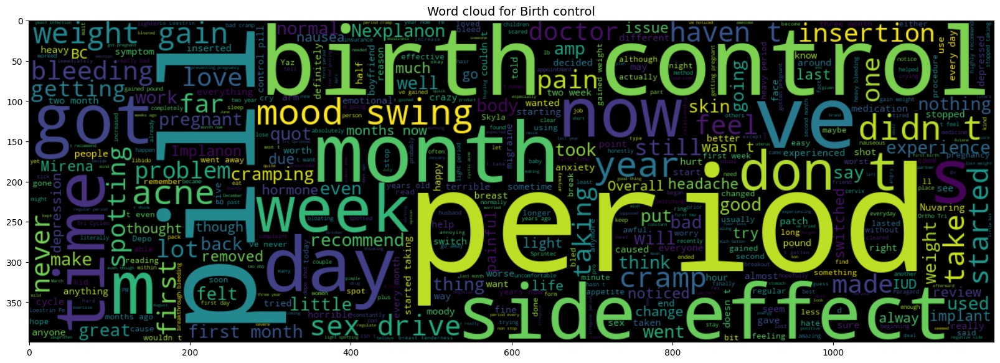

In [65]:
#segregating dataframe for analyzing Birth Control condition

from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_birth.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Birth control',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Depression')

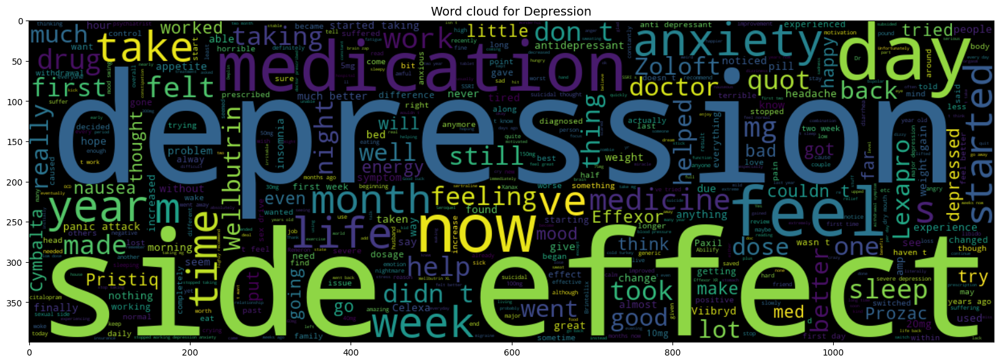

In [66]:
#segregating dataframe for analyzing Depression condition

from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_dep.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Depression',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Pain')

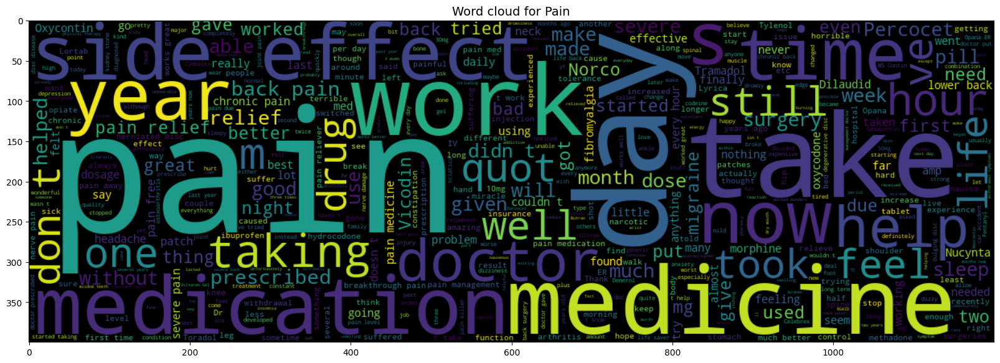

In [67]:
#segregating dataframe for analyzing Pain condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_pa.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Pain',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Acne')

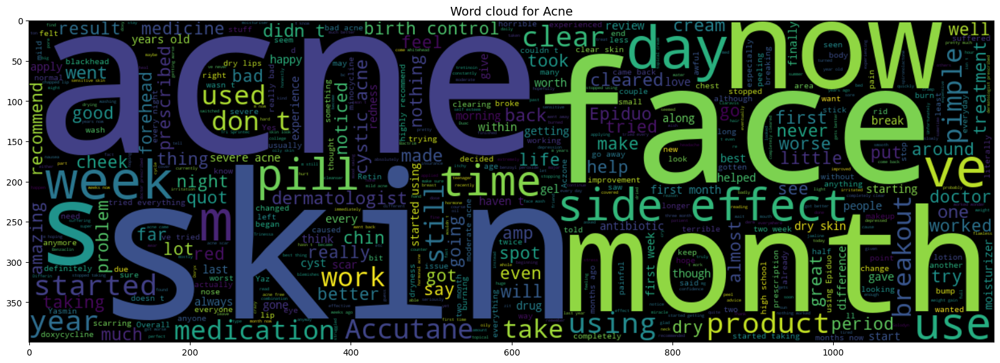

In [68]:
#segregating dataframe for analyzing Acne condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Ac .review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Acne',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Insomnia')

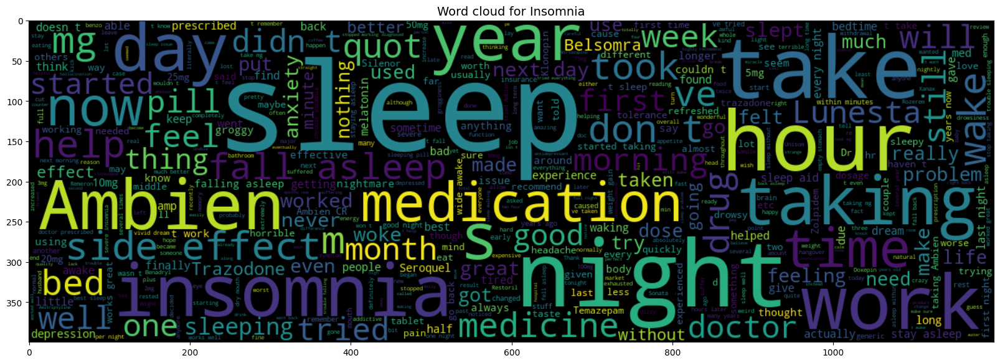

In [69]:
#segregating dataframe for Insomnia analyzing  condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Ins.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Insomnia',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Diabetes')

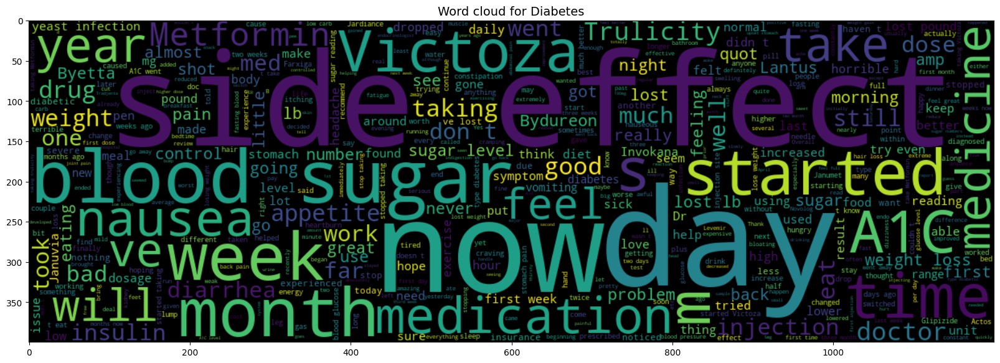

In [70]:
#segregating dataframe for Diabetes analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Dia .review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Diabetes',fontsize=14)

Text(0.5, 1.0, 'Word cloud for High Blood Pressure')

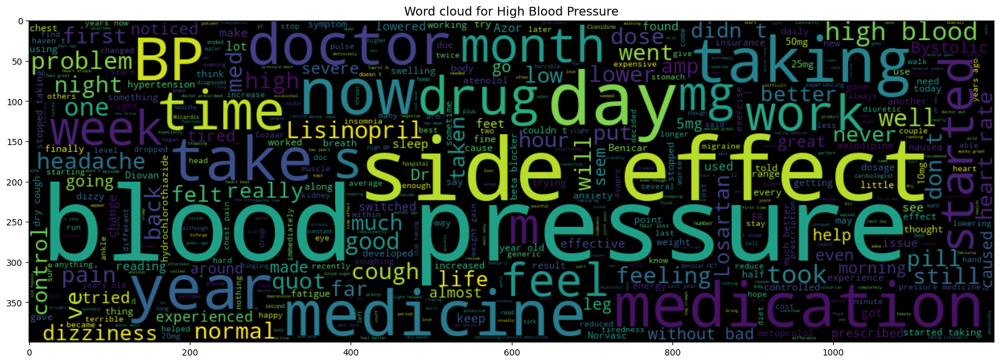

In [71]:
#segregating dataframe for High Blood Pressure analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Hibp.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for High Blood Pressure',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Vaginal Yeast Infection ')

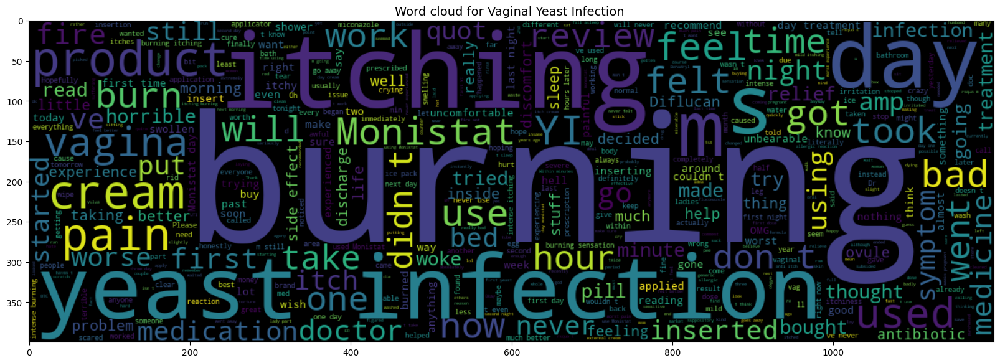

In [72]:
#segregating dataframe for Vaginal Yeast Infection analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_VYI .review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Vaginal Yeast Infection ',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Abnormal Uterine Bleeding ')

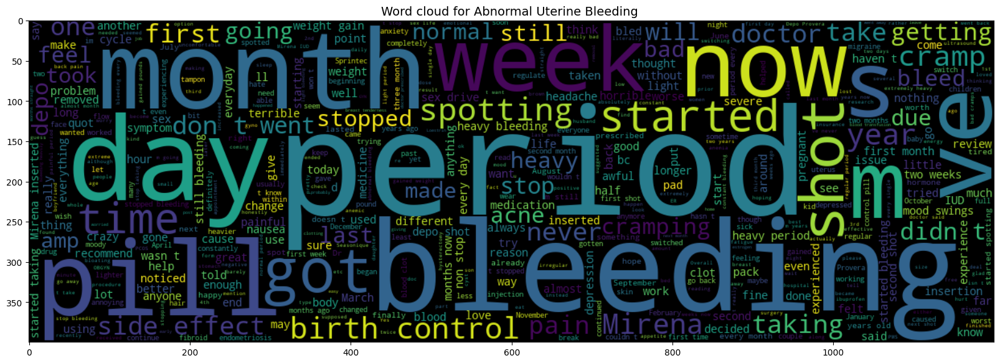

In [73]:
#segregating dataframe for Abnormal Uterine Bleeding analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_AUB.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Abnormal Uterine Bleeding ',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Constipation ')

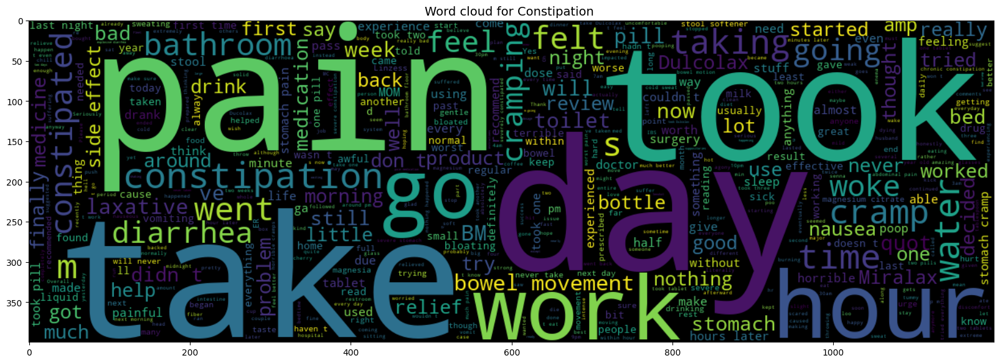

In [74]:
#segregating dataframe for Constipation analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Cons .review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Constipation ',fontsize=14)


Text(0.5, 1.0, 'Word cloud for Chronic Pain ')

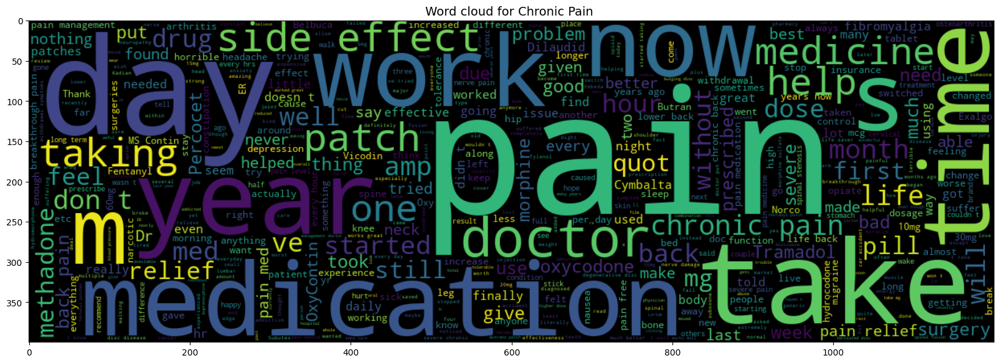

In [75]:
#segregating dataframe for Chronic Pain analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Chrpn .review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Chronic Pain ',fontsize=14)


Data Preprocessing


In [76]:
X['review'][2]

'"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."'

In [77]:
for i,col in enumerate(X.columns):
    X.iloc[:,i] = X.iloc[:,i].str.replace('"', '')

In [78]:
import pandas as pd

pd.set_option('max_colwidth', None)


In [79]:
X.head()

,condition,review
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch"
9,Birth Control,"I had been on the pill for many years. When my doctor changed my RX to chateal, it was as effective. It really did help me by completely clearing my acne, this takes about 6 months though. I did not gain extra weight, or develop any emotional health issues. I stopped taking it bc I started using a more natural method of birth control, but started to take it bc I hate that my acne came back at age 28. I really hope symptoms like depression, or weight gain do not begin to affect me as I am older now. I&#039;m also naturally moody, so this may worsen things. I was in a negative mental rut today. Also I hope this doesn&#039;t push me over the edge, as I believe I am depressed. Hopefully it&#039;ll be just like when I was younger."
11,Depression,"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."
14,Birth Control,"Started Nexplanon 2 months ago because I have a minimal amount of contraception&#039;s I can take due to my inability to take the hormone that is used in most birth controls. I&#039;m trying to give it time because it is one of my only options right now. But honestly if I had options I&#039;d get it removed.\r\nI&#039;ve never had acne problems in my life, and immediately broke out after getting it implanted. Sex drive is completely gone, and I used to have sex with my boyfriend a few days a week, now its completely forced and not even fun for me anymore. I mean I&#039;m on birth control because I like having sex but don&#039;t want to get pregnant, why take a birth control that takes away sex? Very unhappy and hope that I get it back with time or I&#039;m getting it removed."


Stopwords

In [80]:
import nltk
nltk.download('stopwords')# Download stopwords data (if needed)
nltk.download('wordnet')


from nltk.corpus import stopwords
stop = stopwords.words('english')

print(stop[:10])  # Print the first 10 stopwords for demonstration


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]


Lemmitization

In [81]:
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer

porter = PorterStemmer()

lemmatizer = WordNetLemmatizer()

In [82]:
print(porter.stem("sportingly"))
print(porter.stem("very"))
print(porter.stem("troubled"))

sportingli
veri
troubl


In [83]:
print(lemmatizer.lemmatize("sportingly"))
print(lemmatizer.lemmatize("very"))
print(lemmatizer.lemmatize("troubled"))

sportingly
very
troubled


In [84]:
from bs4 import BeautifulSoup
import re

In [85]:
def review_to_words(raw_review):
    # 1. Delete HTML 
    review_text = BeautifulSoup(raw_review, 'html.parser').get_text()
    # 2. Make a space
    letters_only = re.sub('[^a-zA-Z]', ' ', review_text)
    # 3. lower letters
    words = letters_only.lower().split()
    # 5. Stopwords 
    meaningful_words = [w for w in words if not w in stop]
    # 6. lemmitization
    lemmitize_words = [lemmatizer.lemmatize(w) for w in meaningful_words]
    # 7. space join words
    return( ' '.join(lemmitize_words))

In [86]:
X['review_clean'] = X['review'].apply(review_to_words)

C:\Users\HP\AppData\Local\Temp\ipykernel_8992\2066199760.py:3: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  review_text = BeautifulSoup(raw_review, 'html.parser').get_text()


In [87]:
X.head()

,condition,review,review_clean
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.",used take another oral contraceptive pill cycle happy light period max day side effect contained hormone gestodene available u switched lybrel ingredient similar pill ended started lybrel immediately first day period instruction said period lasted two week taking second pack two week third pack thing got even worse third period lasted two week end third week still daily brown discharge positive side side effect idea period free tempting ala
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch",first time using form birth control glad went patch month first decreased libido subsided downside made period longer day exact used period day max also made cramp intense first two day period never cramp using birth control happy patch
9,Birth Control,"I had been on the pill for many years. When my doctor changed my RX to chateal, it was as effective. It really did help me by completely clearing my acne, this takes about 6 months though. I did not gain extra weight, or develop any emotional health issues. I stopped taking it bc I started using a more natural method of birth control, but started to take it bc I hate that my acne came back at age 28. I really hope symptoms like depression, or weight gain do not begin to affect me as I am older now. I&#039;m also naturally moody, so this may worsen things. I was in a negative mental rut today. Also I hope this doesn&#039;t push me over the edge, as I believe I am depressed. Hopefully it&#039;ll be just like when I was younger.",pill many year doctor changed rx chateal effective really help completely clearing acne take month though gain extra weight develop emotional health issue stopped taking bc started using natural method birth control started take bc hate acne came back age really hope symptom like depression weight gain begin affect older also naturally moody may worsen thing negative mental rut today also hope push edge believe depressed hopefully like younger
11,Depression,"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects.",taken anti depressant year improvement mostly moderate severe side affect make go take cymbalta mostly pain began deplin noticed major improvement overnight energy better disposition sinking low low major depression taking month feel like normal person first time ever best thing side effect
14,Birth Control,"Started Nexplanon 2 months ago because I have a minim

Features and Target Variables

In [88]:
X_feat=X['review_clean']
y=X['condition']

In [89]:
X_train,X_test,y_train,y_test=train_test_split(X_feat,y,stratify=y,test_size=0.2,random_state=0)


In [90]:
def plot_confusion_matrix(cm,classes,
                          normalization= False,
                          title='confusion matrix',
                          cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks=np.arange(len(classes))
    plt.xticks(tick_marks,classes,rotation=45)
    plt.yticks(tick_marks,classes)

    if normalization:
        cm=cm.astype('float')/cm.sum(axis=1)[:,np.newaxis]
        print("normalized confusion matrix")
    else:
        print("Confusion matrix ,without normalization")
    thresh = cm.max()/2.
    for i ,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,cm[i ,j],
                 horizontalalignment="center",
                 color="white" if cm[i ,j]>thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Bag Of Words

In [91]:
count_vectorizer=CountVectorizer(stop_words='english')

count_train=count_vectorizer.fit_transform(X_train)

count_test=count_vectorizer.transform(X_test)

In [92]:
count_train

<52446x21784 sparse matrix of type '<class 'numpy.int64'>'
	with 1615746 stored elements in Compressed Sparse Row format>

Machine Learning Model:Naive Bayes

accuracy: 0.894
Confusion matrix ,without normalization


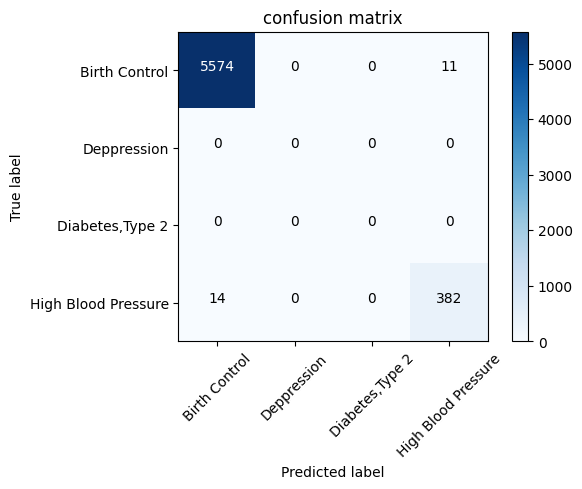

In [93]:
mnb=MultinomialNB()
mnb.fit(count_train,y_train)
pred=mnb.predict(count_test)
score = metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f"% score)

cm=metrics.confusion_matrix(y_test,pred,labels=['Birth Control','Deppression','Diabetes,Type 2','High Blood Pressure'])
plot_confusion_matrix(cm,classes=['Birth Control','Deppression','Diabetes,Type 2','High Blood Pressure'])


Machine Learning Model: Passive Aggresive Classifier

accuracy: 0.904
Confusion matrix ,without normalization


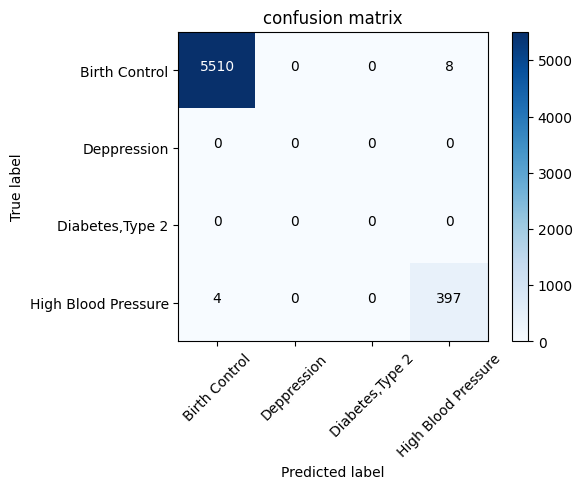

In [94]:
from sklearn.linear_model import PassiveAggressiveClassifier,LogisticRegression

passive=PassiveAggressiveClassifier()
passive.fit(count_train,y_train)
pred = passive.predict(count_test)
score= metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f"% score)

cm=metrics.confusion_matrix(y_test,pred,labels=['Birth Control','Deppression','Diabetes,Type 2','High Blood Pressure'])
plot_confusion_matrix(cm,classes=['Birth Control','Deppression','Diabetes,Type 2','High Blood Pressure'])


TFIDF

In [95]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer= TfidfVectorizer(stop_words='english',max_df=0.8)
tfidf_train_2  = tfidf_vectorizer.fit_transform(X_train)
tfidf_test_2 =tfidf_vectorizer.transform(X_train)

Machine Learning Model TFIDF

accuracy: 0.914
Confusion matrix ,without normalization


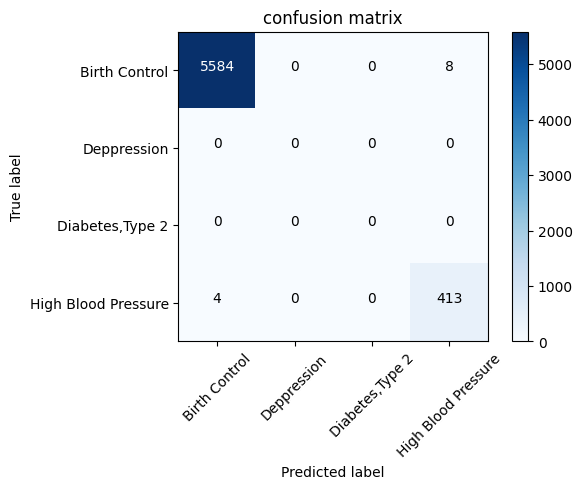

In [96]:
tfidf_vectorizer = TfidfVectorizer(stop_words='english',max_df=0.8)
tfidf_train  = tfidf_vectorizer.fit_transform(X_train)
tfidf_test =tfidf_vectorizer.transform(X_test)

pass_tf =PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train,y_train)
pred= pass_tf.predict(tfidf_test)
score = metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f" % score)
cm = metrics.confusion_matrix(y_test,pred,labels=['Birth Control','Deppression','Diabetes,Type 2','High Blood Pressure'])
plot_confusion_matrix(cm,classes=['Birth Control','Deppression','Diabetes,Type 2','High Blood Pressure'])                                


TFIDF:Bigrams

accuracy 0.941
Confusion matrix ,without normalization


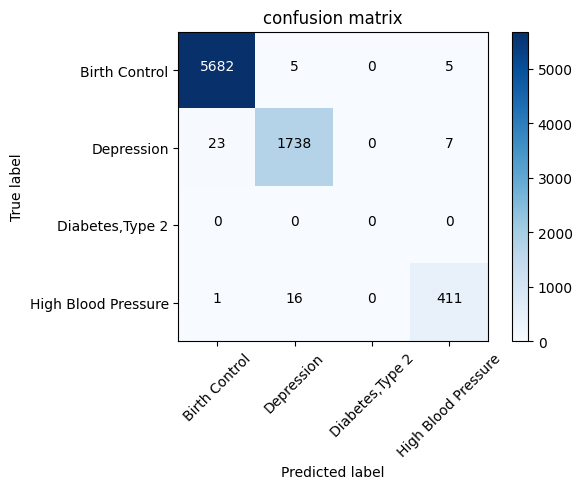

In [97]:
tfidf_vectorizer2 = TfidfVectorizer(stop_words='english',max_df=0.8,ngram_range=(1,2))
tfidf_train_2= tfidf_vectorizer2.fit_transform(X_train)
tfidf_test_2=tfidf_vectorizer2.transform(X_test)

pass_tf=PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train_2,y_train)
pred = pass_tf.predict(tfidf_test_2)
score = metrics.accuracy_score(y_test,pred)
print("accuracy %0.3f"%score)
cm = metrics.confusion_matrix(y_test, pred,labels=['Birth Control','Depression','Diabetes,Type 2','High Blood Pressure'])
plot_confusion_matrix(cm,classes=['Birth Control','Depression','Diabetes,Type 2','High Blood Pressure'])

TFIDF:Trigrams

accuracy 0.941
Confusion matrix ,without normalization


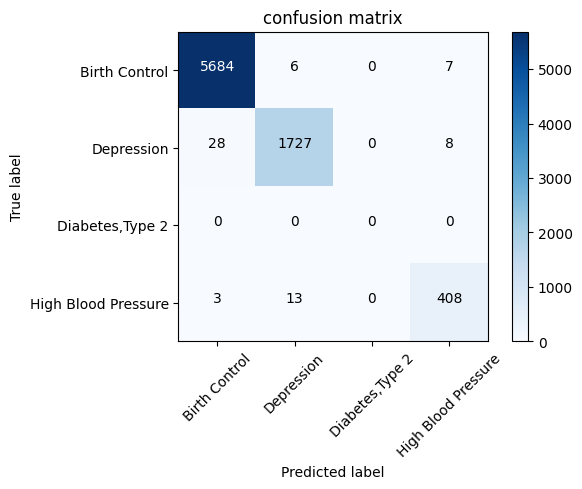

In [98]:
tfidf_vectorizer3 = TfidfVectorizer(stop_words='english',max_df=0.8,ngram_range=(1,3))
tfidf_train_3= tfidf_vectorizer3.fit_transform(X_train)
tfidf_test_3=tfidf_vectorizer3.transform(X_test)

pass_tf=PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train_3,y_train)
pred = pass_tf.predict(tfidf_test_3)
score = metrics.accuracy_score(y_test,pred)
print("accuracy %0.3f"%score)
cm = metrics.confusion_matrix(y_test, pred,labels=['Birth Control','Depression','Diabetes,Type 2','High Blood Pressure'])
plot_confusion_matrix(cm,classes=['Birth Control','Depression','Diabetes,Type 2','High Blood Pressure'])

Most important Features

In [99]:
def most_informative_feature_for_class(vectorizer, classifier, classlabel, n=10):
    labelid = list(classifier.classes_).index(classlabel)
    feature_names = vectorizer.get_feature_names_out()  
    topn = sorted(zip(classifier.coef_[labelid], feature_names))[-n:]
    for coef, feat in topn:
        print(classlabel, feat, coef) 

most_informative_feature_for_class(tfidf_vectorizer,pass_tf,'Birth Control')

Birth Control prostate 0.8082103232758215
Birth Control cutter 0.9885552351592896
Birth Control shorter 1.0361999544395983
Birth Control abut 1.0396870578057922
Birth Control affordable 1.0763600962434001
Birth Control inserting 1.1002883992814223
Birth Control daughter 1.1255620623619558
Birth Control contacting 1.2124444259794043
Birth Control shirk 1.3079077051723171
Birth Control shiseido 1.558150920539999


In [100]:
most_informative_feature_for_class(tfidf_vectorizer,pass_tf,'Depression')

Depression hba 0.5534238432374505
Depression hbc 0.5534238432374505
Depression blush 0.5625454825578812
Depression easy 0.6701729060313791
Depression asberger 0.6760150412674525
Depression easygoing 0.6885673219643871
Depression dizziniess 0.7021607177098729
Depression dwindles 0.7683418687012407
Depression anthill 1.018365459389738
Depression alongside 5.2310591437514065


In [101]:
most_informative_feature_for_class(tfidf_vectorizer,pass_tf,'Diabetes, Type 2')

Diabetes, Type 2 inconsistent 0.3699835069564243
Diabetes, Type 2 training 0.40321983063146977
Diabetes, Type 2 stratterra 0.4056853617486104
Diabetes, Type 2 address 0.4712403681132728
Diabetes, Type 2 spondylothesis 0.4908478122994999
Diabetes, Type 2 trainee 0.49348843855223956
Diabetes, Type 2 abut 0.5206505339867734
Diabetes, Type 2 tragic 0.7289180929171221
Diabetes, Type 2 informational 0.7666744464598422
Diabetes, Type 2 totalling 2.95871860791951


In [102]:
most_informative_feature_for_class(tfidf_vectorizer,pass_tf,'High Blood Pressure')

High Blood Pressure hidrocortizone 0.5361379652510516
High Blood Pressure ht 0.5576800934777298
High Blood Pressure htc 0.5576800934777298
High Blood Pressure inconsistent 0.5715178475203053
High Blood Pressure baseline 0.5907335074460078
High Blood Pressure immediate 0.6204673333358692
High Blood Pressure bash 0.7029463943725213
High Blood Pressure governed 0.7350861962423209
High Blood Pressure goult 0.7444461334642426
High Blood Pressure inconsistently 1.0602132709833587


Sample Prediction

In [103]:
X.tail()

,condition,review,review_clean
161278,"Diabetes, Type 2",I just got diagnosed with type 2. My doctor prescribed Invokana and metformin from the beginning. My sugars went down to normal by the second week. I am losing so much weight. No side effects yet. Miracle medicine for me,got diagnosed type doctor prescribed invokana metformin beginning sugar went normal second week losing much weight side effect yet miracle medicine
161279,Chronic Pain,Used with my throat cancer and it helped numb my throat to be able to eat. I lost 200 pounds but this helped me survive and be able to eat most foods... Soft ones anyway... I know opioids are a bitch but without these I would have died of starvation,used throat cancer helped numb throat able eat lost pound helped survive able eat food soft one anyway know opioids bitch without would died starvation
161286,Depression,"This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap.",third med tried anxiety mild depression week hate much dizzy major diarrhea feel worse started contacting doc changing asap
161290,High Blood Pressure,"I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.",tekturna day effect immediate also calcium channel blocker tiazac hydrochlorothiazide put tekturna palpitation experienced diovan ugly drug opinion company produce however palpitation pretty bad diovan hour monitor ekg etc day substituting tekturna diovan palpitation
161291,Birth Control,"This would be my second month on Junel. I&#039;ve been on Birth Control for about 10 years now. I changed due to spotting and increased mood swings with my previous birth control. Since the switch I have had shorter periods about 2-3 days, but I have gained major weight and increased appetite. I switched up my regular exercise routine and still have not managed to drop the extra 7 lbs ;(",would second month junel birth control year changed due spotting increased mood swing previous birth control since switch shorter period day gained major weight increased appetite switched regular exercise routine still managed drop extra lb


In [104]:
def top_drug_extraction(condition):
    df_filtered = df[(df['rating'] >= 9) & (df['usefulCount'] >= 100)].sort_values(by=['rating', 'usefulCount'], ascending=[False, False])
    drug_lst = df_filtered[df_filtered['condition'] == condition]['drugName'].head(3).tolist()
    return drug_lst


In [105]:
def predict_text(lst_text):
    df_test=pd.DataFrame(lst_text,columns=['test_sent'])
    df_test["test_sent"]=df_test["test_sent"].apply(review_to_words)
    tfidf_bigram=tfidf_vectorizer3.transform(lst_text)
    prediction=pass_tf.predict(tfidf_bigram)
    df_test['prediction']=prediction
    return df_test

In [117]:
sentences =[
     "This would be my second month on Junel. I&#039;ve been on Birth Control for about 10 years now. I changed due to spotting and increased mood swings with my previous birth control. Since the switch I have had shorter periods about 2-3 days, but I have gained major weight and increased appetite. I switched up my regular exercise routine and still have not managed to drop the extra 7 lbs ;(",
     "This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap.",
     "I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.",
     "I just got diagnosed with type 2. My doctor prescribed Invokana and metformin from the beginning. My sugars went down to normal by the second week. I am losing so much weight. No side effects yet. Miracle medicine for me"]

In [118]:
tfidf_trigram=tfidf_vectorizer3.transform(sentences)


predictions=pass_tf.predict(tfidf_trigram)
for text,label in zip(sentences,predictions):
    if label=="High Blood Pressure":
        target="High Blood Pressure"
        top_drugs=top_drug_extraction(label)
        print("text:",text,"\nCondition:",target)
        print("Top 3 Suggested Drug:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Depression":
        target="Depression"
        top_drugs=top_drug_extraction(label)
        print("text:",text,"\nCondition:",target)
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Diabetes,Type 2":
        target="Diabetes,Type 2"
        top_drugs=top_drug_extraction(label)
        print("text:",text,"\nCondition:",target)
        print("Top 3 Suggested Drug:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    else:
        target="Birth Control"
        print("text:",text,"\nCondition:",target)
        print("Top 3 Suggested Drug:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()



text: This would be my second month on Junel. I&#039;ve been on Birth Control for about 10 years now. I changed due to spotting and increased mood swings with my previous birth control. Since the switch I have had shorter periods about 2-3 days, but I have gained major weight and increased appetite. I switched up my regular exercise routine and still have not managed to drop the extra 7 lbs ;( 
Condition: Birth Control
Top 3 Suggested Drug:
Losartan
Aldactone
Spironolactone

text: This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap. 
Condition: Depression
Sertraline
Zoloft
Viibryd

text: I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my 

In [108]:
df_testsent =predict_text(sentences)
df_testsent

,test_sent,prediction
0,got diagnosed type doctor prescribed invokana metformin beginning sugar went normal second week losing much weight side effect yet miracle medicine,"Diabetes, Type 2"
1,third med tried anxiety mild depression week hate much dizzy major diarrhea feel worse started contacting doc changing asap,Depression
2,tekturna day effect immediate also calcium channel blocker tiazac hydrochlorothiazide put tekturna palpitation experienced diovan ugly drug opinion company produce however palpitation pretty bad diovan hour monitor ekg etc day substituting tekturna diovan palpitation,High Blood Pressure


In [109]:
import joblib
joblib.dump(tfidf_vectorizer3,'tfidfvectorizer.pk1')
joblib.dump(pass_tf,'passmodel.pkl')

['passmodel.pkl']

In [110]:
vectorizer=joblib.load('tfidfvectorizer.pk1')
model = joblib.load('passmodel.pkl')

test =model.predict(vectorizer.transform(["I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations."]))
test[0]

'High Blood Pressure'

In [111]:
vectorizer=joblib.load('tfidfvectorizer.pk1')
model = joblib.load('passmodel.pkl')

test =model.predict(vectorizer.transform(["This would be my second month on Junel. I&#039;ve been on Birth Control for about 10 years now. I changed due to spotting and increased mood swings with my previous birth control. Since the switch I have had shorter periods about 2-3 days, but I have gained major weight and increased appetite. I switched up my regular exercise routine and still have not managed to drop the extra 7 lbs ;("]))
test[0]

'Birth Control'